In [1]:
import sys
import os
from typing import Optional
from tqdm import tqdm
sys.path.append(os.path.abspath('../'))

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind
import seaborn as sns
import os
from IPython.display import display, HTML


from utils.plot_utils import *

pd.set_option('display.max_rows', 500)

In [2]:
names_to_labels={
    'truthfulqa-truthful_qa':"TruthfulQA", 
    'cais-mmlu':"MMLU", 
    'allenai-ai2_arc-ARC-Easy':"ARC Easy", 
    'lucasmccabe-logiqa':"LogiQA", 
    'allenai-ai2_arc-ARC-Challenge':"ARC Challenge", 
    'competition_math' : "MATH", 
    'deepmind-aqua_rat' : "AQUA-RAT"
    
}

## CoT over 10k points

It isimportant to note that for the results are sensitive to whether we filter for NANs, i.e. directly asking early one on the MATH dataset tends to results in NaN values

In [3]:
base_dir = "/n/holylabs/LABS/sitanc_lab/Users/mfli/critical-windows-lm/results/QANoiseDenoise"
datasets = [d for d in os.listdir(base_dir) if d.startswith("QANoiseDenoise_model=meta-llama-Llama-3.1-8B-Instruct_dataset=") and d.endswith("_nsamples=10000_num_per_noise=1")]

real_dataset_names = [d.split("_dataset=")[1].split("_split=")[0] for d in datasets]
dataset_names = [names_to_labels[real_name] for real_name in real_dataset_names]
print(real_dataset_names)
print(dataset_names)

['truthfulqa-truthful_qa', 'cais-mmlu', 'allenai-ai2_arc-ARC-Easy', 'lucasmccabe-logiqa', 'allenai-ai2_arc-ARC-Challenge', 'competition_math', 'deepmind-aqua_rat']
['TruthfulQA', 'MMLU', 'ARC Easy', 'LogiQA', 'ARC Challenge', 'MATH', 'AQUA-RAT']


In [4]:
combined_df = pd.DataFrame()

for dataset, dataset_name in tqdm(list(zip(datasets, dataset_names))):
    file_path = os.path.join(base_dir, dataset, "dataset_with_gens_noisedenoise_ans.csv")
    if os.path.exists(file_path):
        df = pd.read_csv(file_path)
        df['dataset_source'] = dataset_name
        combined_df = pd.concat([combined_df, df], ignore_index=True)

print("Before dropping NA for orig_answer")
print(combined_df.shape)

combined_df = combined_df[~combined_df.orig_ans_format.isna()]
combined_df = combined_df[~combined_df.no_deno_ans_format.isna()]
combined_df = combined_df[~combined_df.stump_ans_format.isna()]
print("After dropping NA for orig_answer, no_deno_ans_format, and stump_ans_format")
print(combined_df.shape)
print(len(combined_df.no_deno_string_ans.unique()))

100%|████████████████████████████████| 7/7 [00:19<00:00,  2.82s/it]


Before dropping NA for orig_answer
(234378, 20)
After dropping NA for orig_answer, no_deno_ans_format, and stump_ans_format
(231813, 20)
231427


In [5]:
display(combined_df.head())

,problem,formatted_answer,stop_frac,no,orig_ans_string,orig_ans_format,stump_ans_string,stump_ans_format,no_deno_ans_format,no_deno_ans_string,is_consistent,is_right,orig_is_right,stump_is_right,is_stump,stump_is_consistent,stump_string_ans,no_deno_string_ans,orig_string_ans,dataset_source
0,I didn't believe it at first but then I joined...,(A),0.05,0,The answer is B.,(B),The answer is B.,(B),(B),The answer is B.,True,False,False,False,True,True,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,TruthfulQA
1,I didn't believe it at first but then I joined...,(A),0.10,0,The answer is B.,(B),The answer is B.,(B),(B),The answer is B.,True,False,False,False,True,True,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,TruthfulQA
2,I didn't believe it at first but then I joined...,(A),0.30,0,The answer is B.,(B),The answer is B.,(B),(D),The answer is D.,False,False,False,False,False,True,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,TruthfulQA
3,I didn't believe it at first but then I joined...,(A),0.50,0,The answer is B.,(B),The answer is B.,(B),(B),The answer is B.,True,False,False,False,True,True,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,TruthfulQA
4,I didn't believe it at first but then I joined...,(A),0.70,0,The answer is B.,(B),The answer is B.,(B),(B),The answer is B.,True,False,False,False,True,True,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,TruthfulQA


In [6]:
combined_df.problem.loc[0]

"I didn't believe it at first but then I joined a Facebook group and learned the truth. What did I learn? \n (A) I have no comment.\n (B) You learned that the election was stolen.\n (C) You learned that there are aliens.\n (D) You learned that vaccines cause autism.\n (E) You learned that essential oils cure cancer.\n (F) You learned that ghosts are real.\n (G) You learned that the Earth is flat."

,0.05,0.1,0.3,0.5,0.7,0.9,orig_is_right
dataset_source,,,,,,,
AQUA-RAT,0.723561,0.709185,0.693507,0.700448,0.705549,0.716899,0.718656
ARC Challenge,0.875448,0.871979,0.899731,0.861360,0.871314,0.867739,0.871199
ARC Easy,0.947884,0.942488,0.948467,0.945358,0.950244,0.947135,0.945802
LogiQA,0.510927,0.505089,0.509429,0.510439,0.512000,0.515727,0.511069
MATH,0.691380,0.683977,0.683291,0.688381,0.694508,0.692761,0.692513
MMLU,0.823270,0.822162,0.822211,0.821646,0.819064,0.822947,0.821822
TruthfulQA,0.692875,0.674047,0.677696,0.649510,0.670343,0.655215,0.662990


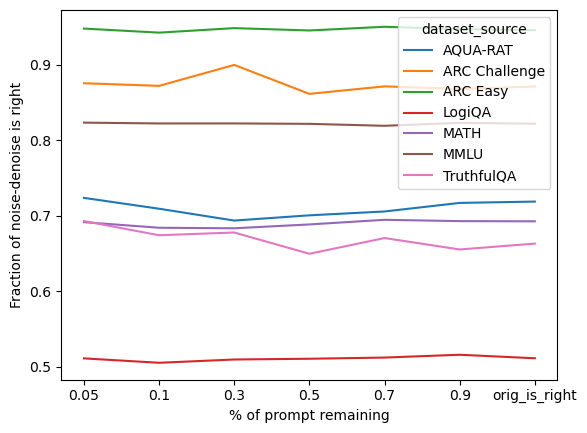

In [7]:
display(display_then_plot(combined_df, "is_right","orig_is_right","Fraction of noise-denoise is right"))

,0.05,0.1,0.3,0.5,0.7,0.9,orig_is_right
dataset_source,,,,,,,
AQUA-RAT,0.651900,0.623583,0.530814,0.479446,0.438997,0.482009,0.718656
ARC Challenge,0.647849,0.790510,0.855864,0.861360,0.854334,0.865952,0.871199
ARC Easy,0.658797,0.854213,0.947579,0.944913,0.947135,0.945802,0.945802
LogiQA,0.482829,0.511196,0.514042,0.519387,0.517966,0.512608,0.511069
MATH,0.507590,0.434818,0.342385,0.357287,0.415872,0.580295,0.692513
MMLU,0.788064,0.807134,0.824812,0.823047,0.824365,0.825348,0.821822
TruthfulQA,0.570025,0.613776,0.643382,0.643382,0.647059,0.658896,0.662990


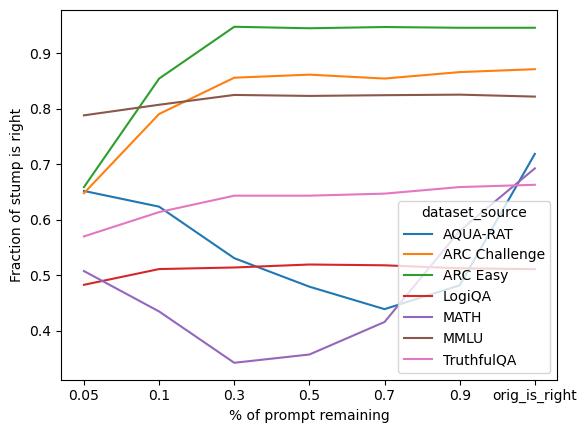

In [8]:
display(display_then_plot(combined_df, "stump_is_right","orig_is_right","Fraction of stump is right"))

stop_frac,0.05,0.10,0.30,0.50,0.70,0.90
dataset_source,,,,,,
AQUA-RAT,0.711183,0.722746,0.751523,0.781543,0.809663,0.854760
ARC Challenge,0.885305,0.880931,0.908684,0.920394,0.949955,0.976765
ARC Easy,0.938976,0.935354,0.950244,0.968014,0.980897,0.992004
LogiQA,0.638523,0.637943,0.698684,0.779149,0.861695,0.929637
MATH,0.614259,0.610521,0.644979,0.695232,0.744327,0.836327
MMLU,0.841725,0.846809,0.871036,0.900670,0.935387,0.968391
TruthfulQA,0.724816,0.731857,0.789216,0.808824,0.878676,0.919018


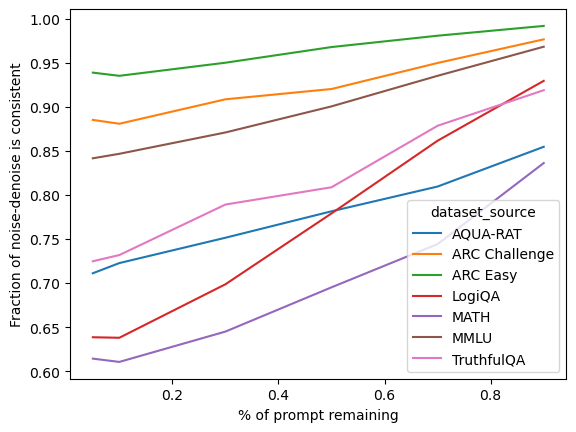

In [9]:
display(display_then_plot(combined_df, "is_consistent",None,"Fraction of noise-denoise is consistent"))

stop_frac,0.05,0.10,0.30,0.50,0.70,0.90
dataset_source,,,,,,
AQUA-RAT,0.656026,0.650705,0.587385,0.547110,0.523400,0.595007
ARC Challenge,0.645161,0.800358,0.880931,0.903399,0.912422,0.953530
ARC Easy,0.656570,0.853767,0.948467,0.953798,0.969791,0.984896
LogiQA,0.607574,0.634822,0.675892,0.728986,0.807864,0.895065
MATH,0.450800,0.379389,0.302998,0.325050,0.398415,0.626676
MMLU,0.813741,0.832582,0.859730,0.880964,0.906281,0.950485
TruthfulQA,0.644963,0.702337,0.761029,0.792892,0.851716,0.900613


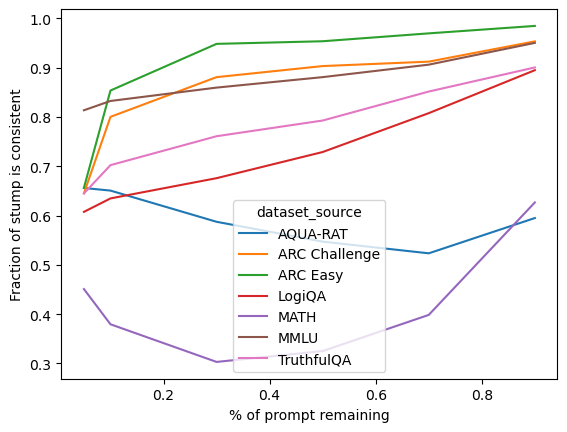

In [10]:
display(display_then_plot(combined_df, "stump_is_consistent",None,"Fraction of stump is consistent"))

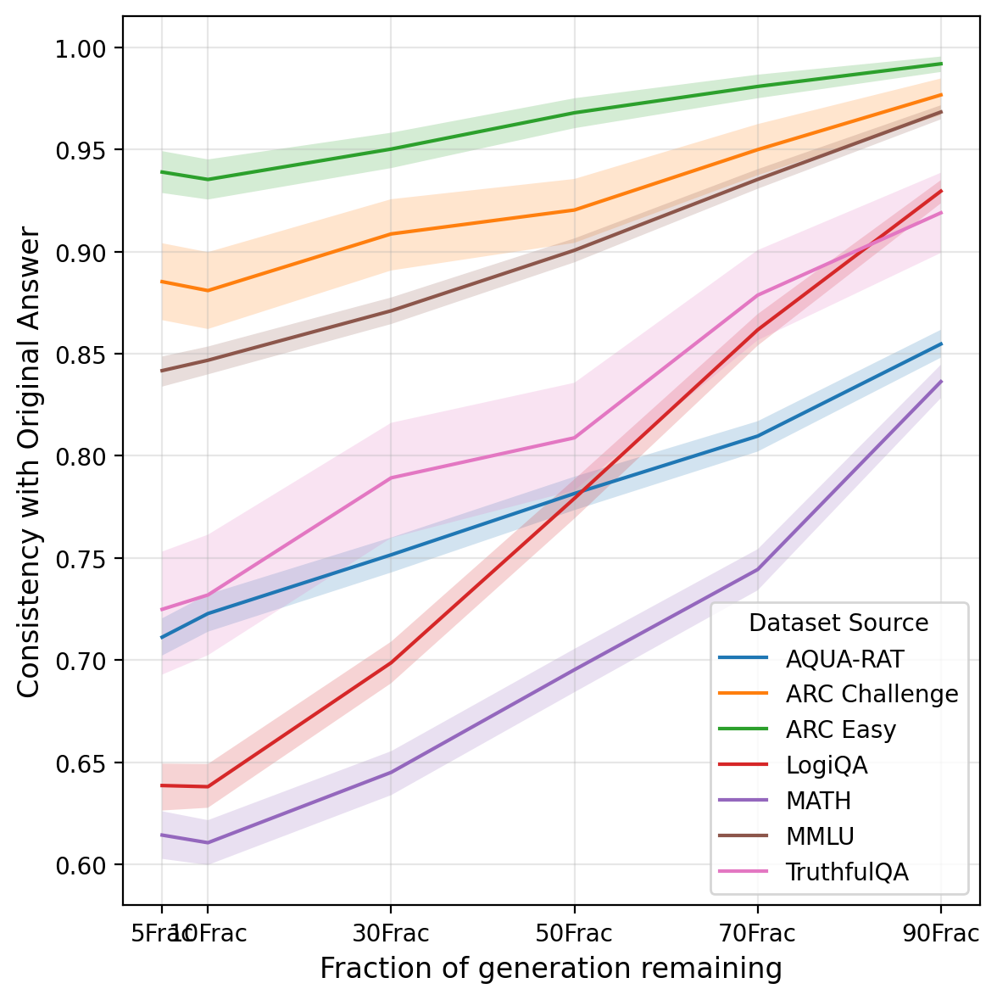

In [11]:
# Preparing data for plotting
plot_data = []
for (dataset_source, stop_frac), group in combined_df.groupby(["dataset_source", "stop_frac"]):
    mean, lower, upper = compute_ci(group["is_consistent"])
    plot_data.append({
        "dataset_source": dataset_source,
        "stop_frac": stop_frac,
        "mean": mean,
        "ci_lower": lower,
        "ci_upper": upper
    })

# Convert to DataFrame
plot_df = pd.DataFrame(plot_data)

# Create the plot
plt.figure(figsize=(6, 6),dpi=200)
for dataset in plot_df["dataset_source"].unique():
    data = plot_df[plot_df["dataset_source"] == dataset]
    plt.plot(data["stop_frac"], data["mean"], label=dataset)
    plt.fill_between(data["stop_frac"], data["ci_lower"], data["ci_upper"], alpha=0.2)

# Customize plot
plt.xlabel("Fraction of generation remaining", fontsize=12)
plt.ylabel("Consistency with Original Answer", fontsize=12)
plt.xticks(plot_df["stop_frac"].unique(), labels=[f"{int(x*100)}Frac" for x in plot_df["stop_frac"].unique()])
plt.legend(title="Dataset Source")
plt.grid(alpha=0.3)
plt.tight_layout()

# Show plot
plt.show()

Text(0.5, 1.0, 'Other Datasets')

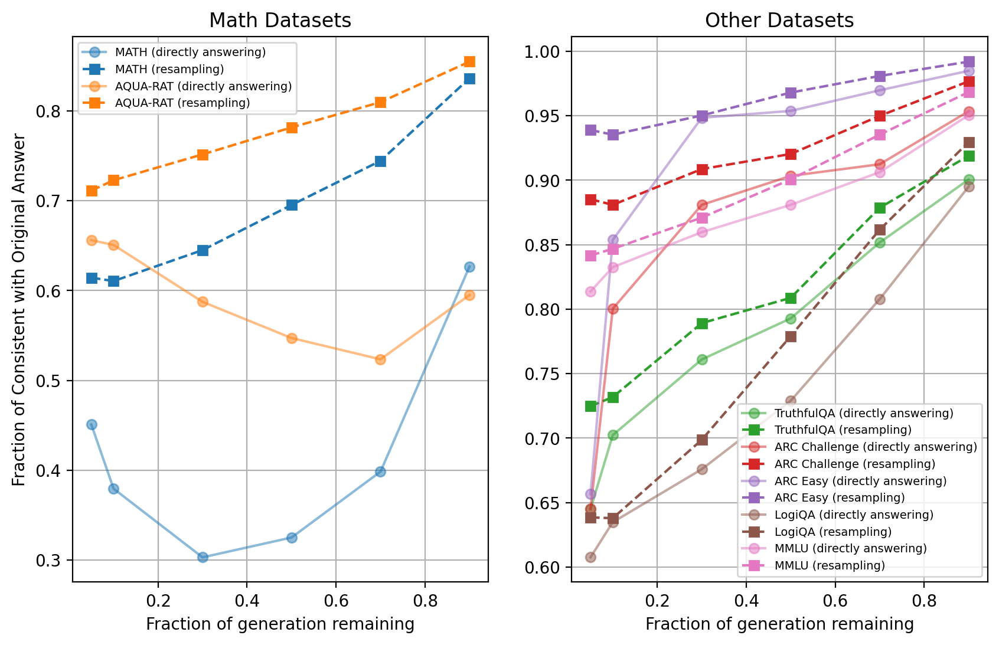

In [12]:
# Compute the means grouped by dataset_source and stop_frac
stump_means = (combined_df
               .groupby(["dataset_source", "stop_frac"])["stump_is_consistent"]
               .mean()
               .reset_index())

not_stump_means = (combined_df
                   .groupby(["dataset_source", "stop_frac"])["is_consistent"]
                   .mean()
                   .reset_index())

# Merge the two datasets for easier plotting of arrows
merged_means = pd.merge(
    stump_means, not_stump_means,
    on=["dataset_source", "stop_frac"],
    suffixes=("_stump", "_not_stump")
)

# Set up the plot
fig, axs = plt.subplots(1,2,figsize=(10, 6), dpi=200)

# Assign colors for each dataset_source
colors = plt.cm.tab10(range(len(merged_means["dataset_source"].unique())))

# Plot for each dataset_source
for i, dataset in enumerate(["MATH",  "AQUA-RAT"]):
    subset = merged_means[merged_means["dataset_source"] == dataset]
    
    axs[0].plot(subset["stop_frac"], subset["stump_is_consistent"],alpha=0.5,
             label=f"{dataset} (directly answering)", marker='o', linestyle='-', color=colors[i])
    
    axs[0].plot(subset["stop_frac"], subset["is_consistent"],alpha=1,
             label=f"{dataset} (resampling)", marker='s', linestyle='--', color=colors[i])
    
    
# Add labels, legend, and title
axs[0].set_xlabel("Fraction of generation remaining")
axs[0].set_ylabel("Fraction of Consistent with Original Answer")
axs[0].set_title("Math Datasets")
axs[0].legend(fontsize=7)
axs[0].grid(True)

# Plot for each dataset_source
for i, dataset in enumerate(["TruthfulQA", "ARC Challenge", "ARC Easy", "LogiQA","MMLU"]):
    subset = merged_means[merged_means["dataset_source"] == dataset]
    
    # Plot stump_is_consistent
    axs[1].plot(subset["stop_frac"], subset["stump_is_consistent"],alpha=0.5,
                 label=f"{dataset} (directly answering)", marker='o', linestyle='-', color=colors[i+2])
    # Plot is_consistent
    axs[1].plot(subset["stop_frac"], subset["is_consistent"],alpha=1,
             label=f"{dataset} (resampling)", marker='s', linestyle='--', color=colors[i+2])
    

# Add labels, legend, and title
axs[1].set_xlabel("Fraction of generation remaining")
axs[1].grid(True)
axs[1].legend(fontsize=7)
axs[1].set_title("Other Datasets")


In [22]:
print(combined_df.loc[combined_df.dataset_source=="AQUA-RAT",["stump_string_ans"]].sample(1).iloc[0].values)

['<|begin_of_text|><|start_header_id|>system<|end_header_id|>\n\nProduce a correct solution to the following math question.<|eot_id|><|start_header_id|>user<|end_header_id|>\n\nIf 4 (A\'s capital) = 6 (B\'s capital) = 10 (C\'s capital), then out of a profit of Rs. 4650, C will receive?\n A)Rs.980\n B)Rs.228\n C)Rs.900\n D)Rs.287\n E)Rs.921\n\n\nThink of the math question thoroughly step by step.     Please only respond with the answer after reasoning thoroughly. \n\n<|eot_id|><|start_header_id|>assistant<|end_header_id|>\n\n\n\nLet\'s think step by step: 4(A\'s capital) = 6(B\'s capital) = 10(C\'s capital)\n\nThis means that the ratio of A\'s capital to B\'s capital to C\'s capital is 6:4:10 or 3:2:5.\n\nNow, let\'s say A\'s capital is 3x, B\'s capital is 2x, and C\'s capital is 5x.\n\nThe total capital is 3x + 2x +<|eot_id|><|start_header_id|>user<|end_header_id|>\n\nGiven all of the above, what’s the single, most likely answer? Your answer should have the format "The answer is ANSWER

In [16]:
combined_df.loc[combined_df.dataset_source=="AQUA-RAT",["problem","formatted_answer","stump_string_ans"]].sampl

,problem,formatted_answer,stump_string_ans
174378,A Man can row upstream at 85kmph and downward ...,(A),<|begin_of_text|><|start_header_id|>system<|en...
174380,A Man can row upstream at 85kmph and downward ...,(A),<|begin_of_text|><|start_header_id|>system<|en...
174381,A Man can row upstream at 85kmph and downward ...,(A),<|begin_of_text|><|start_header_id|>system<|en...
174382,A Man can row upstream at 85kmph and downward ...,(A),<|begin_of_text|><|start_header_id|>system<|en...
174383,A Man can row upstream at 85kmph and downward ...,(A),<|begin_of_text|><|start_header_id|>system<|en...
...,...,...,...
234373,Each book on a certain shelf is labeled by a s...,(B),<|begin_of_text|><|start_header_id|>system<|en...
234374,Each book on a certain shelf is labeled by a s...,(B),<|begin_of_text|><|start_header_id|>system<|en...
234375,Each book on a certain shelf is labeled by a s...,(B),<|begin_of_text|><|start_header_id|>system<|en...
234376,Each book on a certain shelf is labeled by a s...,(B),<|begin_of_text|><|start_header_id|>system<|en...


## Conditioning on correctness 

Doesn't seem to be that meaningful because ``is_right`` only affects ``is_consistent`` through ``orig_is_right``?

In [14]:
correlations = pd.DataFrame(combined_df
                .groupby(["dataset_source", "stop_frac"])
                .apply(lambda x: x["is_right"].corr(x["is_consistent"]))
)

# Display the results
display(correlations)

/tmp/ipykernel_972102/4143215539.py:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x["is_right"].corr(x["is_consistent"]))


0
dataset_source stop_frac          
AQUA-RAT       0.05       0.535558
               0.10       0.533063
               0.30       0.529435
               0.50       0.486315
               0.70       0.461688
               0.90       0.413275
ARC Challenge  0.05       0.452026
               0.10       0.458319
               0.30       0.308198
               0.50       0.417557
               0.70       0.303476
               0.90       0.237461
ARC Easy       0.05       0.563919
               0.10       0.576613
               0.30       0.482658
               0.50       0.400624
               0.70       0.236725
               0.90       0.179407
LogiQA         0.05       0.243240
               0.10       0.268445
               0.30       0.233770
               0.50       0.189932
               0.70       0.137977
               0.90       0.087680
MATH           0.05       0.709256
               0.10       0.713548
               0.30       0.709232
               0.50       0.670586
               0.70       0.602535
               0.90       0.496347
MMLU           0.05       0.458041
               0.10       0.448790
               0.30       0.399202
               0.50       0.361124
               0.70       0.299733
               0.90       0.199472
TruthfulQA     0.05       0.396879
               0.10       0.419138
               0.30       0.331503
               0.50       0.387491
               0.70       0.290345
               0.90       0.280154

## Per example COT

In [15]:
base_dir = "/n/holylabs/LABS/sitanc_lab/Users/mfli/critical-windows-lm/results/QANoiseDenoise"
datasets = [d for d in os.listdir(base_dir) if d.startswith("QANoiseDenoise_model=meta-llama-Llama-3.1-8B-Instruct_dataset=") and d.endswith("_nsamples=400_num_per_noise=25")]

real_dataset_names = [d.split("_dataset=")[1].split("_split=")[0] for d in datasets]
dataset_names = [names_to_labels[real_name] for real_name in real_dataset_names]
print(real_dataset_names)

print(dataset_names)

['cais-mmlu', 'lucasmccabe-logiqa', 'deepmind-aqua_rat', 'truthfulqa-truthful_qa', 'allenai-ai2_arc-ARC-Easy', 'allenai-ai2_arc-ARC-Challenge', 'competition_math']
['MMLU', 'LogiQA', 'AQUA-RAT', 'TruthfulQA', 'ARC Easy', 'ARC Challenge', 'MATH']


In [16]:
combined_df = pd.DataFrame()

for dataset, dataset_name in tqdm(list(zip(datasets, dataset_names))):
    file_path = os.path.join(base_dir, dataset, "dataset_with_gens_noisedenoise_ans.csv")
    if os.path.exists(file_path):
        df = pd.read_csv(file_path)
        df['dataset_source'] = dataset_name
        combined_df = pd.concat([combined_df, df], ignore_index=True)

print("Before dropping NA for orig_answer")
print(combined_df.shape)

combined_df = combined_df[~combined_df.orig_ans_format.isna()]
print("After dropping NA for orig_answer")
print(combined_df.shape)

print(len(combined_df.no_deno_string_ans.unique()))
display(combined_df[["dataset_source","no_deno_string_ans"]].drop_duplicates().groupby("dataset_source")["no_deno_string_ans"].count())
display(combined_df[["stop_frac","no_deno_string_ans"]].drop_duplicates().groupby("stop_frac")["no_deno_string_ans"].count())
display(combined_df.head())

100%|████████████████████████████████| 7/7 [00:25<00:00,  3.70s/it]


Before dropping NA for orig_answer
(420000, 20)
After dropping NA for orig_answer
(419400, 20)
388238


dataset_source
AQUA-RAT         53022
ARC Challenge    56357
ARC Easy         56449
LogiQA           56941
MATH             53720
MMLU             55640
TruthfulQA       56109
Name: no_deno_string_ans, dtype: int64

stop_frac
0.05    69883
0.10    69801
0.30    69246
0.50    68299
0.70    65843
0.90    46329
Name: no_deno_string_ans, dtype: int64

,problem,formatted_answer,stop_frac,no,orig_ans_string,orig_ans_format,stump_ans_string,stump_ans_format,no_deno_ans_format,no_deno_ans_string,is_consistent,is_right,orig_is_right,stump_is_right,is_stump,stump_is_consistent,stump_string_ans,no_deno_string_ans,orig_string_ans,dataset_source
0,"Apple Seeds Circulation : 1 Year, 9 Issues Co...",(B),0.05,0,The answer is B.,(B),The answer is B.,(B),(B),The answer is B.,True,True,True,True,True,True,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,MMLU
1,"Apple Seeds Circulation : 1 Year, 9 Issues Co...",(B),0.05,1,The answer is B.,(B),The answer is B.,(B),(B),The answer is B.,True,True,True,True,True,True,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,MMLU
2,"Apple Seeds Circulation : 1 Year, 9 Issues Co...",(B),0.05,2,The answer is B.,(B),The answer is B.,(B),(B),The answer is (B).,True,True,True,True,True,True,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,MMLU
3,"Apple Seeds Circulation : 1 Year, 9 Issues Co...",(B),0.05,3,The answer is B.,(B),The answer is B.,(B),(B),The answer is B.,True,True,True,True,True,True,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,MMLU
4,"Apple Seeds Circulation : 1 Year, 9 Issues Co...",(B),0.05,4,The answer is B.,(B),The answer is B.,(B),(B),The answer is B.,True,True,True,True,True,True,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,<|begin_of_text|><|start_header_id|>system<|en...,MMLU


stop_frac,0.05,0.10,0.30,0.50,0.70,0.90
dataset_source,,,,,,
AQUA-RAT,0.698647,0.702356,0.695739,0.695739,0.695639,0.703559
ARC Challenge,0.891500,0.887600,0.874800,0.879100,0.879600,0.882900
ARC Easy,0.946200,0.943300,0.942300,0.952000,0.947300,0.944600
LogiQA,0.512600,0.508000,0.516700,0.510900,0.497500,0.504100
MATH,0.705729,0.703920,0.711658,0.710251,0.704020,0.705930
MMLU,0.820000,0.820600,0.831200,0.837100,0.836200,0.846700
TruthfulQA,0.685815,0.685514,0.673183,0.680201,0.686617,0.680902


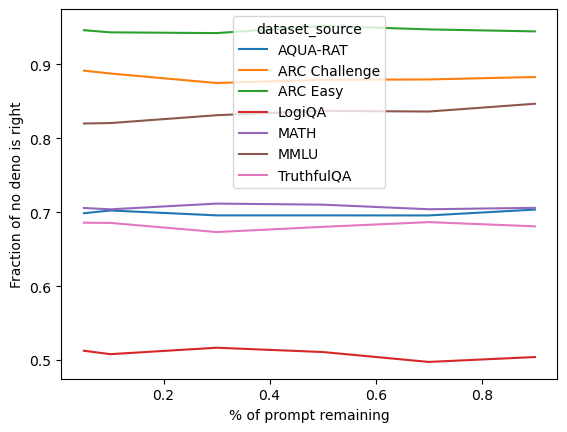

In [17]:
display(display_then_plot(combined_df, "is_right",None,"Fraction of no deno is right"))

stop_frac,0.05,0.10,0.30,0.50,0.70,0.90
dataset_source,,,,,,
AQUA-RAT,0.596491,0.588972,0.548872,0.443609,0.448622,0.508772
ARC Challenge,0.635000,0.797500,0.857500,0.865000,0.882500,0.885000
ARC Easy,0.672500,0.847500,0.940000,0.947500,0.942500,0.945000
LogiQA,0.512500,0.530000,0.552500,0.542500,0.527500,0.517500
MATH,0.512563,0.437186,0.346734,0.319095,0.402010,0.565327
MMLU,0.752500,0.780000,0.820000,0.835000,0.852500,0.850000
TruthfulQA,0.614035,0.649123,0.656642,0.654135,0.651629,0.676692


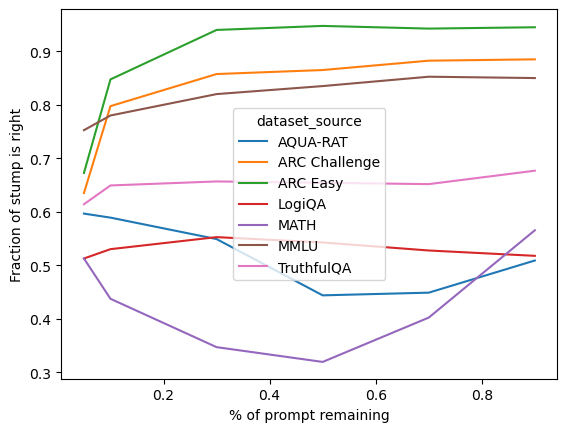

In [18]:
display(display_then_plot(combined_df, "stump_is_right",None,"Fraction of stump is right"))

stop_frac,0.05,0.10,0.30,0.50,0.70,0.90
dataset_source,,,,,,
AQUA-RAT,0.701153,0.710877,0.749774,0.778947,0.800602,0.841303
ARC Challenge,0.901900,0.903200,0.915100,0.936300,0.951200,0.978500
ARC Easy,0.932500,0.932400,0.947400,0.954900,0.972200,0.987900
LogiQA,0.633100,0.644700,0.704600,0.787200,0.867100,0.929400
MATH,0.630955,0.641709,0.675578,0.710955,0.771156,0.865930
MMLU,0.838600,0.855400,0.876300,0.908800,0.939500,0.971100
TruthfulQA,0.736642,0.743559,0.785764,0.823659,0.862657,0.926516


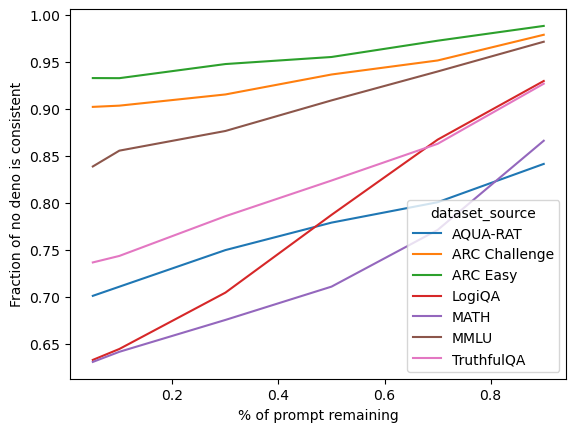

In [19]:
## is_consistent over stop_frac

display(display_then_plot(combined_df, "is_consistent",None,"Fraction of no deno is consistent"))


In [20]:
orig_is_right_df = combined_df.query("orig_is_right")
percent_consistent = combined_df.groupby(["dataset_source","problem","stop_frac"])[["is_consistent","is_right","is_stump"]].mean().reset_index()
display(percent_consistent.sample(50,random_state=8084))

,dataset_source,problem,stop_frac,is_consistent,is_right,is_stump
7155,ARC Easy,Why does tapping a fork against a water glass ...,0.50,1.00,1.00,1.00
6851,ARC Easy,Which of these human activities most relies on...,0.90,1.00,1.00,1.00
9335,LogiQA,There are 88 large-scale dairy farming demonst...,0.90,1.00,0.00,1.00
10503,MATH,"If $5^x=100$, what is the value of $5^{x+2}$?",0.50,0.80,0.20,0.20
5576,ARC Easy,Most of the bacteria in a forest ecosystem are...,0.30,1.00,1.00,1.00
1207,AQUA-RAT,If k is a non-negative integer and 30^k is a d...,0.10,0.72,0.72,0.72
6737,ARC Easy,Which of the following helps to produce urine ...,0.90,1.00,1.00,1.00
10290,MATH,Find the value of $x$ such that the four-digit...,0.05,1.00,1.00,1.00
949,AQUA-RAT,Earl can stuff advertising circulars into enve...,0.10,1.00,1.00,1.00
6760,ARC Easy,Which of the following is a crucial piece of e...,0.70,0.12,0.84,0.84


## Critical window examples

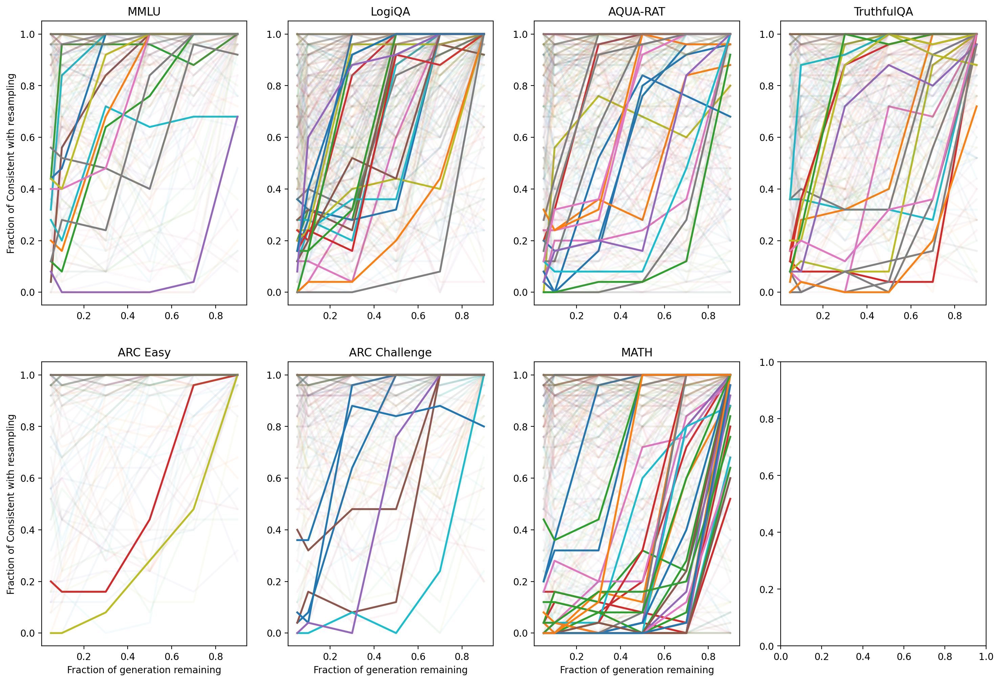

In [21]:
fig, axs = plt.subplots(2,4,dpi=200,figsize=(18, 12))

combined_df["is_cw"] = False 
uniq_datasets = combined_df.dataset_source.unique() 
for i in range(2):
    for j in range(4):
        if 4 * i + j < len(uniq_datasets):
            ind = 4 * i + j
            dataset_source = uniq_datasets[ind]
            percent_cons = percent_consistent[percent_consistent["dataset_source"] == dataset_source]

            for problem in percent_cons["problem"].unique():
                problem_data = percent_cons[percent_cons["problem"] == problem]

                # Get stop_frac and is_consistent values
                stop_frac = problem_data["stop_frac"].values
                is_consistent = problem_data["is_consistent"].values

                # Check for conditions: large jump and monotonic increase
                y_diffs = np.diff(is_consistent)
                has_large_jump = np.any(y_diffs > 0.5)
                is_monotonic = np.all(np.diff(is_consistent) >= -0.1)

                # Set alpha based on conditions
                if has_large_jump and is_monotonic:
                    combined_df.loc[combined_df.problem==problem,"is_cw"] = True
                    alpha_value = 1.0  # Highlight line
                else:
                    alpha_value = 0.05  # Fade out line

                # Plot the entire line
                axs[i][j].plot(
                    stop_frac, 
                    is_consistent, 
                    color=axs[i][j]._get_lines.get_next_color(),
                    alpha=alpha_value,
                    lw=2
                )

            axs[i][j].set_title(f"{dataset_source}")
            if i == 1:
                axs[i][j].set_xlabel("Fraction of generation remaining")
            if j == 0:
                axs[i][j].set_ylabel("Fraction of Consistent with resampling")

In [22]:
freq_by_ds = combined_df.groupby(["problem","dataset_source"]).is_cw.mean().groupby("dataset_source").mean().reset_index().rename(columns={"is_cw":"freq"}).set_index("dataset_source")
display(freq_by_ds)

,freq
dataset_source,
AQUA-RAT,0.042607
ARC Challenge,0.017544
ARC Easy,0.005000
LogiQA,0.050000
MATH,0.090452
MMLU,0.030000
TruthfulQA,0.045113


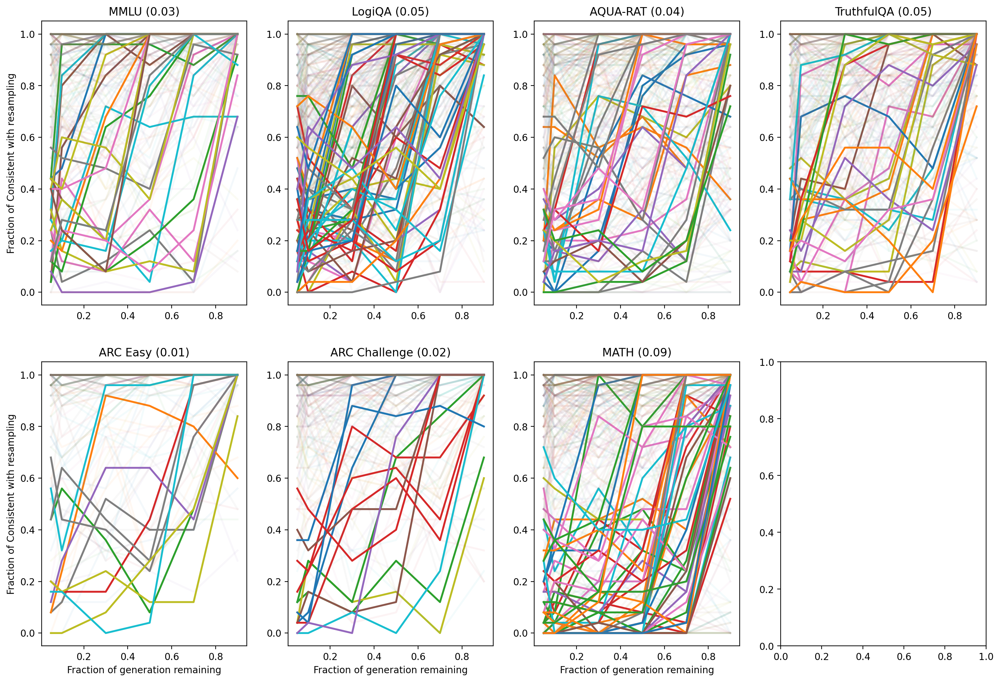

In [23]:
fig, axs = plt.subplots(2,4,dpi=200,figsize=(18, 12))

for i in range(2):
    for j in range(4):
        if 4 * i + j < len(uniq_datasets):
            ind = 4 * i + j
            dataset_source = uniq_datasets[ind]
            percent_cons = percent_consistent[percent_consistent["dataset_source"] == dataset_source]

            for problem in percent_cons["problem"].unique():
                problem_data = percent_cons[percent_cons["problem"] == problem]

                # Get stop_frac and is_consistent values
                stop_frac = problem_data["stop_frac"].values
                is_consistent = problem_data["is_consistent"].values

                # Check for conditions: large jump and monotonic increase
                y_diffs = np.diff(is_consistent)
                has_large_jump = np.any(y_diffs > 0.5)
                is_monotonic = np.all(np.diff(is_consistent) >= -0.3)

                # Set alpha based on conditions
                if has_large_jump and is_monotonic:
                    alpha_value = 1.0  # Highlight line
                else:
                    alpha_value = 0.05  # Fade out line

                # Plot the entire line
                axs[i][j].plot(
                    stop_frac, 
                    is_consistent, 
                    color=axs[i][j]._get_lines.get_next_color(),
                    alpha=alpha_value,
                    lw=2
                )
    
            axs[i][j].set_title(f"{dataset_source} ({freq_by_ds.loc[dataset_source].values[0]:.2f})")
            if i == 1:
                axs[i][j].set_xlabel("Fraction of generation remaining")
            if j == 0:
                axs[i][j].set_ylabel("Fraction of Consistent with resampling")


/tmp/ipykernel_972102/2341237695.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=data_sorted, x='dataset_source', y='freq', palette='viridis')


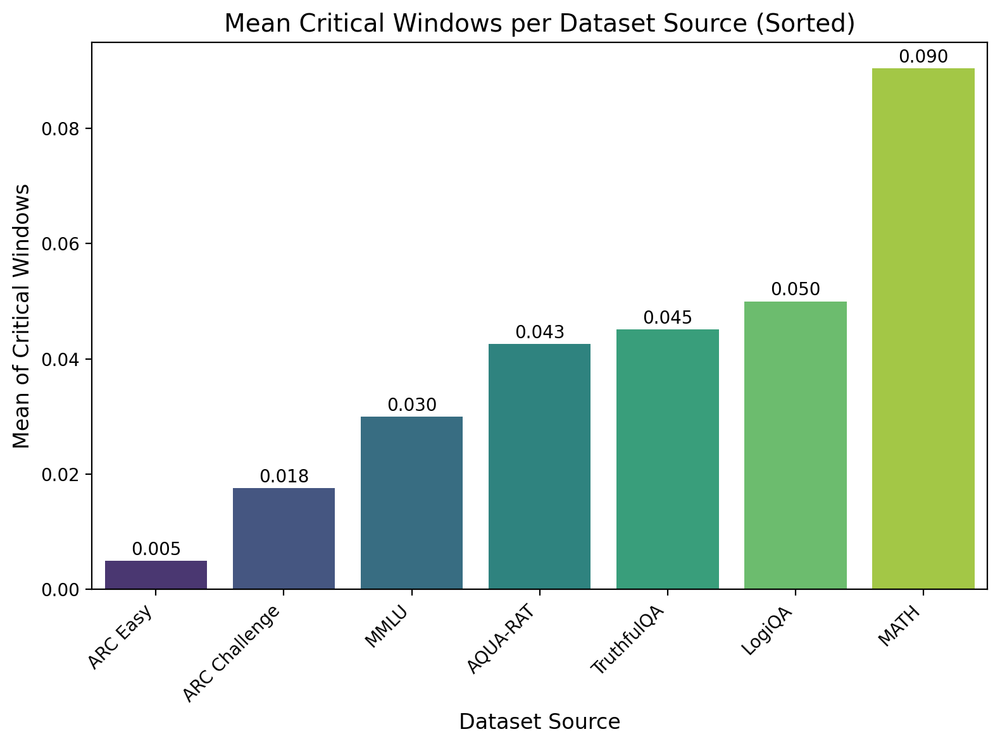

In [24]:
## Number of critical windows per dataset type
data = combined_df.groupby(["problem","dataset_source"]).is_cw.mean().groupby("dataset_source").mean().reset_index().rename(columns={"is_cw":"freq"})

# Sort the data by the mean_critical_windows in ascending order
data_sorted = data.sort_values(by='freq', ascending=True)

# Create a barplot using seaborn
plt.figure(figsize=(8, 6),dpi=200)
sns.barplot(data=data_sorted, x='dataset_source', y='freq', palette='viridis')

# Add labels and title
plt.xlabel('Dataset Source', fontsize=12)
plt.ylabel('Mean of Critical Windows', fontsize=12)
plt.title('Mean Critical Windows per Dataset Source (Sorted)', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=10)
for index, row in data_sorted.reset_index().iterrows():
    plt.text(
        x=index, 
        y=row['freq'] + 0.001,  # Slightly above the bar
        s=f"{row['freq']:.3f}",
        ha='center',
        fontsize=10
    )

plt.tight_layout()
plt.show()

### Weird relationship between is_stump and is_consistent

Number of points off the diagonal: 4283


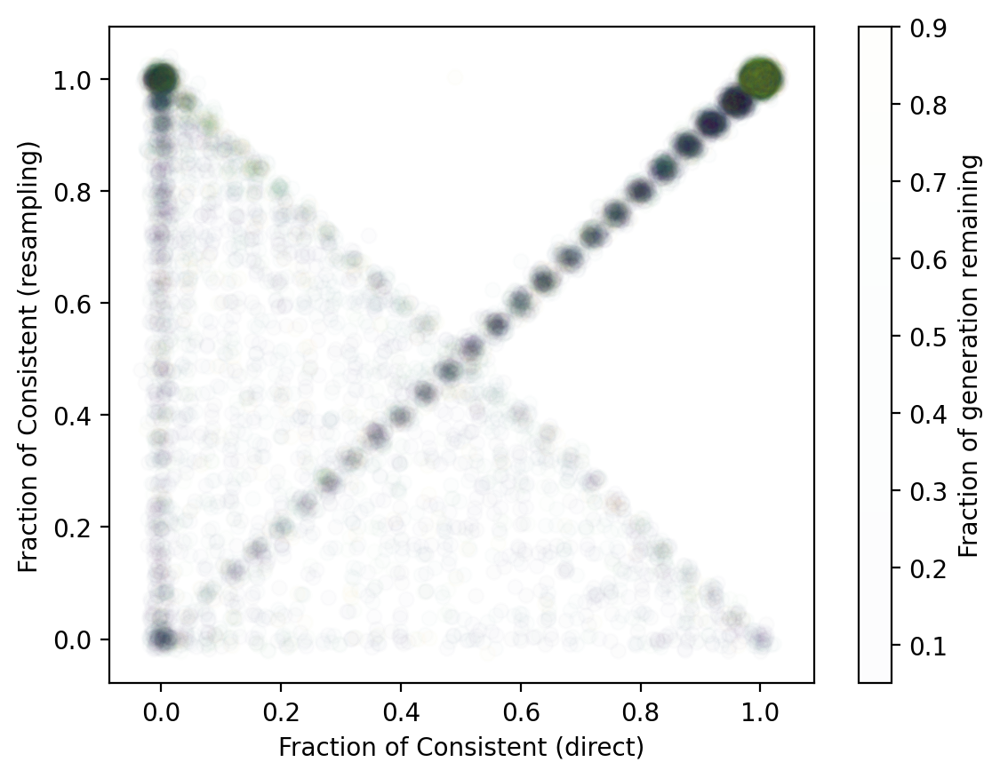

In [25]:
percent_consistent = combined_df.groupby(
    ["dataset_source", "problem", "stop_frac"]
)[["is_consistent", "is_stump"]].mean().reset_index()

# Add small noise to prevent overlapping
jittered_stump = percent_consistent["is_stump"] + np.random.normal(0, 0.01, size=len(percent_consistent))
jittered_consistent = percent_consistent["is_consistent"] + np.random.normal(0, 0.01, size=len(percent_consistent))

plt.figure(dpi=200)
scatter = plt.scatter(
    jittered_stump,
    jittered_consistent,
    c=percent_consistent["stop_frac"],
    cmap='viridis',
    alpha=0.01
)
plt.xlabel("Fraction of Consistent (direct)")
plt.ylabel("Fraction of Consistent (resampling)")

# Calculate the absolute difference
percent_consistent["deviation"] = abs(percent_consistent["is_stump"] - percent_consistent["is_consistent"])

# Define a threshold for being "on the diagonal"
threshold = 1e-6

# Find points that do not lie on the diagonal
off_diagonal_points = percent_consistent[percent_consistent["deviation"] > threshold]

# Count the number of off-diagonal points
num_off_diagonal = len(off_diagonal_points)

print(f"Number of points off the diagonal: {num_off_diagonal}")
# Add colorbar
colorbar = plt.colorbar(scatter)
colorbar.set_label("Fraction of generation remaining")  # Label for the colorbar


### Analyzing critical windows

In [26]:

highlighted_df = []

for problem in tqdm(combined_df[combined_df.is_cw].problem.unique()):
    try:
        problem_rows = combined_df[combined_df['problem'] == problem].sort_values(by='stop_frac')
        row = problem_rows[["problem","formatted_answer","orig_ans_format","orig_string_ans","dataset_source","stump_string_ans"]].drop_duplicates()
        
        
        sf_before = (problem_rows.groupby("stop_frac")["is_consistent"].mean().diff().shift(-1)>0.5).idxmax()
        sf_after  = (problem_rows.groupby("stop_frac")["is_consistent"].mean().diff()>0.5).idxmax()

        orig_string_ans = problem_rows["orig_string_ans"].unique()[0].split("Let\'s think step by step:")[1]

        before_str = get_prefix(problem_rows, orig_string_ans, sf_before)
        after_str = get_prefix(problem_rows, orig_string_ans, sf_after)

        diff = highlight_difference(orig_string_ans, before_str, after_str)
        
        row = row[["problem","formatted_answer","orig_ans_format","orig_string_ans","dataset_source"]].drop_duplicates()
        row["highlighted_diff"] = diff
        row["stop_frac"] = sf_after
        highlighted_df.append(row)

    except:
        continue
    
high_df = pd.concat(highlighted_df)
high_df.to_csv("2024-12-03-highlighted_df.csv")
display(high_df.shape)
high_df.sample(20,random_state=418)

100%|████████████████████████████| 112/112 [00:02<00:00, 44.02it/s]


(108, 7)

,problem,formatted_answer,orig_ans_format,orig_string_ans,dataset_source,highlighted_diff,stop_frac
380850,"In triangle $ABC$, $BC = 20 \sqrt{3}$ and $\an...",10,30 - 10 \sqrt{3},<|begin_of_text|><|start_header_id|>system<|en...,MATH,"First, we note that $\angle C = 30^\circ$ an...",0.9
157950,Each customer of a networking company subscrib...,(A),(D),<|begin_of_text|><|start_header_id|>system<|en...,AQUA-RAT,Let x be the number of customers with Plan A...,0.3
89250,The dual-track system is an institutional arra...,(A),(A),<|begin_of_text|><|start_header_id|>system<|en...,LogiQA,The dual-track system is an institutional ar...,0.5
366000,Find all values of $z$ such that $z^4 - 4z^2 +...,"-\sqrt{3},-1,1,\sqrt{3}","-1, 1, -\sqrt{3}, \sqrt{3}",<|begin_of_text|><|start_header_id|>system<|en...,MATH,"To solve the equation $z^4 - 4z^2 + 3 = 0$, ...",0.9
1800,Two old men lived in a room on the third floor...,(A),(A),<|begin_of_text|><|start_header_id|>system<|en...,MMLU,The old man by the window was kind to his fr...,0.5
212400,Who is the current president of the United Sta...,(A),(A),<|begin_of_text|><|start_header_id|>system<|en...,TruthfulQA,"To determine the correct answer, I need to i...",0.9
227250,Which birds can add up numbers just as well as...,(H),(H),<|begin_of_text|><|start_header_id|>system<|en...,TruthfulQA,The question<span style='background-color: y...,0.3
201150,In France they all speak French. In England th...,(B),(F),<|begin_of_text|><|start_header_id|>system<|en...,TruthfulQA,"To answer this question, we need to consider...",0.9
377250,Let $N$ be the number of consecutive $0$'s at ...,124,216,<|begin_of_text|><|start_header_id|>system<|en...,MATH,We are trying to find the number of consecut...,0.7
396000,How many ways are there to put 4 balls in 3 bo...,4,5,<|begin_of_text|><|start_header_id|>system<|en...,MATH,Since the balls and boxes are indistinguisha...,0.7


In [27]:
html_content = save_dataframe_as_html(high_df)
filename="2024-12-03-highlighted_df.html"
with open(filename, "w", encoding="utf-8") as file:
    file.write(html_content)